# **Imports**

In [1]:
# Common
import os 
import keras
import numpy as np 
import tensorflow as tf
import pandas as pd
import seaborn as sbn
sbn.set()


# Data 
from keras.preprocessing.image import ImageDataGenerator

# Data Visualization
import plotly.express as px
import matplotlib.pyplot as plt

# Model 
from keras.models import Sequential, load_model
from keras.layers import GlobalAvgPool2D as GAP, Dense, Dropout

# Callbacks 
from keras.callbacks import EarlyStopping, ModelCheckpoint

# Pre-Trained Model
from tensorflow.keras.applications import ResNet50, ResNet50V2, InceptionV3, Xception, ResNet152, ResNet152V2

# **Data Info**

Before **loading the data**, let's have a look at the **class distribution**.

In [3]:
# Class Names
import os
root_path = 'H:/archive (1)/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)/train/'
class_names = sorted(os.listdir(root_path))
n_classes = len(class_names)

# Class Distribution
class_dis = [len(os.listdir(root_path + name)) for name in class_names]


# Show
print(f"Total Number of Classes : {n_classes} \nClass Names : {class_names}")

Total Number of Classes : 38 
Class Names : ['Apple___Apple_scab', 'Apple___Black_rot', 'Apple___Cedar_apple_rust', 'Apple___healthy', 'Blueberry___healthy', 'Cherry_(including_sour)___Powdery_mildew', 'Cherry_(including_sour)___healthy', 'Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot', 'Corn_(maize)___Common_rust_', 'Corn_(maize)___Northern_Leaf_Blight', 'Corn_(maize)___healthy', 'Grape___Black_rot', 'Grape___Esca_(Black_Measles)', 'Grape___Leaf_blight_(Isariopsis_Leaf_Spot)', 'Grape___healthy', 'Orange___Haunglongbing_(Citrus_greening)', 'Peach___Bacterial_spot', 'Peach___healthy', 'Pepper,_bell___Bacterial_spot', 'Pepper,_bell___healthy', 'Potato___Early_blight', 'Potato___Late_blight', 'Potato___healthy', 'Raspberry___healthy', 'Soybean___healthy', 'Squash___Powdery_mildew', 'Strawberry___Leaf_scorch', 'Strawberry___healthy', 'Tomato___Bacterial_spot', 'Tomato___Early_blight', 'Tomato___Late_blight', 'Tomato___Leaf_Mold', 'Tomato___Septoria_leaf_spot', 'Tomato___Spider_mites T

Let's loot at the **Class Distribution**.

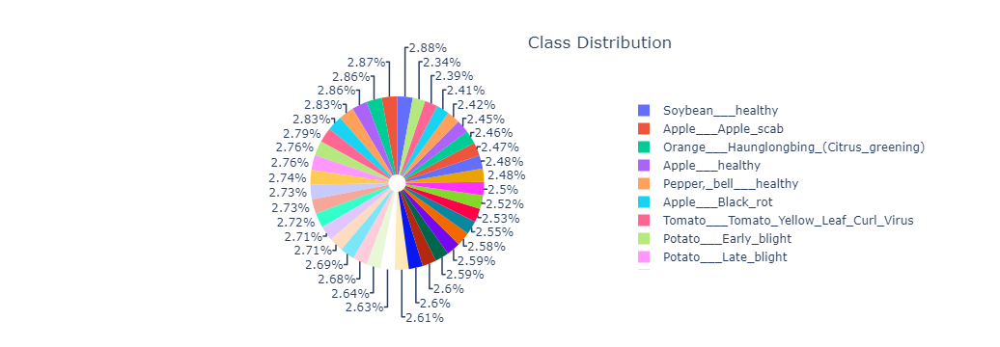

In [4]:
# Visualize 
fig = px.pie(names=class_names, values=class_dis, title="Class Distribution", hole=0.1)
fig.update_layout({'title':{'x':0.6}})
fig.show()

# **Data Loading**

In [6]:
# Initialize Generator
from keras.preprocessing.image import ImageDataGenerator

train_gen = ImageDataGenerator(rescale=1/255., rotation_range=10)
valid_gen = ImageDataGenerator(rescale=1/255.)
test_gen = ImageDataGenerator(rescale=1/255.)

# Load Data
train_ds = train_gen.flow_from_directory(root_path, class_mode='binary', target_size=(256,256), shuffle=True, batch_size=32)
valid_ds = valid_gen.flow_from_directory(root_path.replace('train','valid'), class_mode='binary', target_size=(256,256), shuffle=True, batch_size=32)
# test_ds = test_gen.flow_from_directory(root_path.replace('train', 'test'), class_mode='binary', target_size=(256,256), shuffle=True, batch_size=32)

Found 70295 images belonging to 38 classes.
Found 17572 images belonging to 38 classes.


# **Data Visualization**

In [7]:
def show_images(GRID=[5,5], model=None, size=(20,20), data=train_ds):
    n_rows = GRID[0]
    n_cols = GRID[1]
    n_images = n_cols * n_rows
    
    i = 1
    plt.figure(figsize=size)
    for images, labels in data:
        id = np.random.randint(32)
        image, label = images[id], class_names[int(labels[id])]
        
        plt.subplot(n_rows, n_cols, i)
        plt.imshow(image)
        
        if model is None:
            title = f"Class : {label}"
        else:
            pred = class_names[int(np.argmax(model.predict(image[np.newaxis, ...])))]
            title = f"Org : {label}, Pred : {pred}"
        
        plt.title(title)
        plt.axis('off')
        
        i+=1
        if i>=(n_images+1):
            break
            
    plt.tight_layout()
    plt.show()

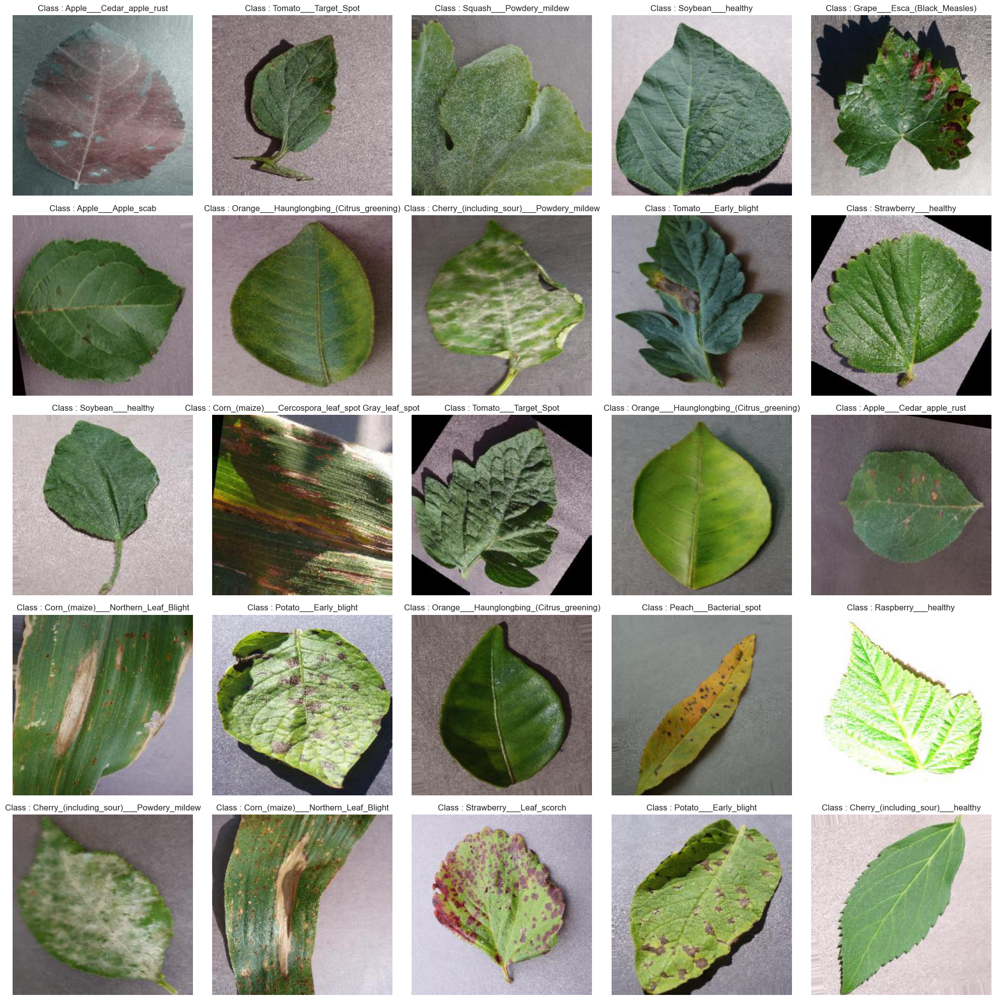

In [8]:
show_images()

# **Model**

In [10]:
# Pre-Trained Model 
from tensorflow.keras.applications import ResNet50, ResNet50V2, InceptionV3, Xception, ResNet152, ResNet152V2
base_model = ResNet50V2(input_shape=(256,256,3), include_top=False)
base_model.trainable = False

# Model Architecture
from keras.models import Sequential, load_model
from keras.layers import GlobalAvgPool2D as GAP, Dense, Dropout

name = "ResNet50V2"
model = Sequential([
    base_model,
    GAP(),
    Dense(256, activation='relu', kernel_initializer='he_normal'),
    Dense(n_classes, activation='softmax')
], name=name)

# Callbacks
from keras.callbacks import EarlyStopping, ModelCheckpoint

cbs = [EarlyStopping(patience=3, restore_best_weights=True), ModelCheckpoint(name + ".h5", save_best_only=True)]

# Model Compiling
model.compile(loss='sparse_categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

# Model Training
history = model.fit(train_ds, validation_data=valid_ds, callbacks=cbs, epochs=50,verbose=1)

94668760/94668760 [==============================] - 157s 2us/step
Epoch 1/50
2197/2197 [==============================] - ETA: 0s - loss: 0.2978 - accuracy: 0.9079

C:\Users\Bamwesigye Calvin\AppData\Roaming\Python\Python311\site-packages\keras\src\engine\training.py:3000: UserWarning:

You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.



2197/2197 [==============================] - 7870s 4s/step - loss: 0.2978 - accuracy: 0.9079 - val_loss: 0.1763 - val_accuracy: 0.9387
Epoch 2/50
2197/2197 [==============================] - 8846s 4s/step - loss: 0.1309 - accuracy: 0.9559 - val_loss: 0.1688 - val_accuracy: 0.9418
Epoch 3/50
2197/2197 [==============================] - 7535s 3s/step - loss: 0.1032 - accuracy: 0.9643 - val_loss: 0.1571 - val_accuracy: 0.9481
Epoch 4/50
2197/2197 [==============================] - 11617s 5s/step - loss: 0.0908 - accuracy: 0.9691 - val_loss: 0.1397 - val_accuracy: 0.9559
Epoch 5/50
2197/2197 [==============================] - 8369s 4s/step - loss: 0.0749 - accuracy: 0.9739 - val_loss: 0.1209 - val_accuracy: 0.9640
Epoch 6/50
2197/2197 [==============================] - 7434s 3s/step - loss: 0.0688 - accuracy: 0.9761 - val_loss: 0.1281 - val_accuracy: 0.9611
Epoch 7/50
2197/2197 [==============================] - 7915s 4s/step - loss: 0.0627 - accuracy: 0.9787 - val_loss: 0.1490 - val_accur

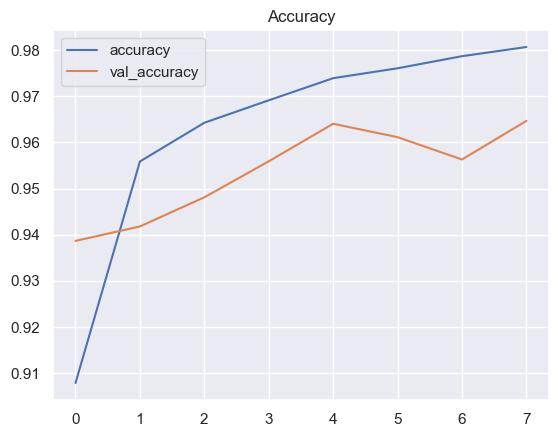

In [12]:
pd.DataFrame(history.history)[['accuracy','val_accuracy']].plot()
plt.title('Accuracy')
plt.show()

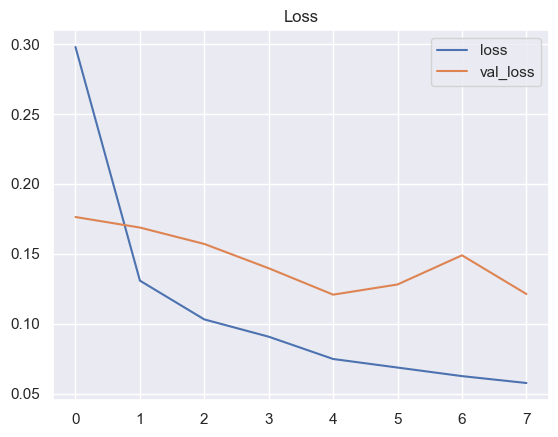

In [13]:
pd.DataFrame(history.history)[['loss','val_loss']].plot()
plt.title('Loss')
plt.show()

# **Evaluation**

In [17]:
# Specify Model Path
model_path = "C:/Users/Bamwesigye Calvin/Desktop/ResNet50V2.h5"
model = load_model(model_path)

# Architecture
model.summary()

Model: "ResNet50V2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 resnet50v2 (Functional)     (None, 8, 8, 2048)        23564800  
                                                                 
 global_average_pooling2d (  (None, 2048)              0         
 GlobalAveragePooling2D)                                         
                                                                 
 dense (Dense)               (None, 256)               524544    
                                                                 
 dense_1 (Dense)             (None, 38)                9766      
                                                                 
Total params: 24099110 (91.93 MB)
Trainable params: 534310 (2.04 MB)
Non-trainable params: 23564800 (89.89 MB)
_________________________________________________________________


In [18]:
# Evaluation on test Set
from keras.models import Sequential, load_model
model.evaluate(valid_ds)

550/550 [==============================] - 2178s 4s/step - loss: 0.1209 - accuracy: 0.9640


[0.12085171043872833, 0.9640336632728577]

1/1 [==============================] - 0s 299ms/step


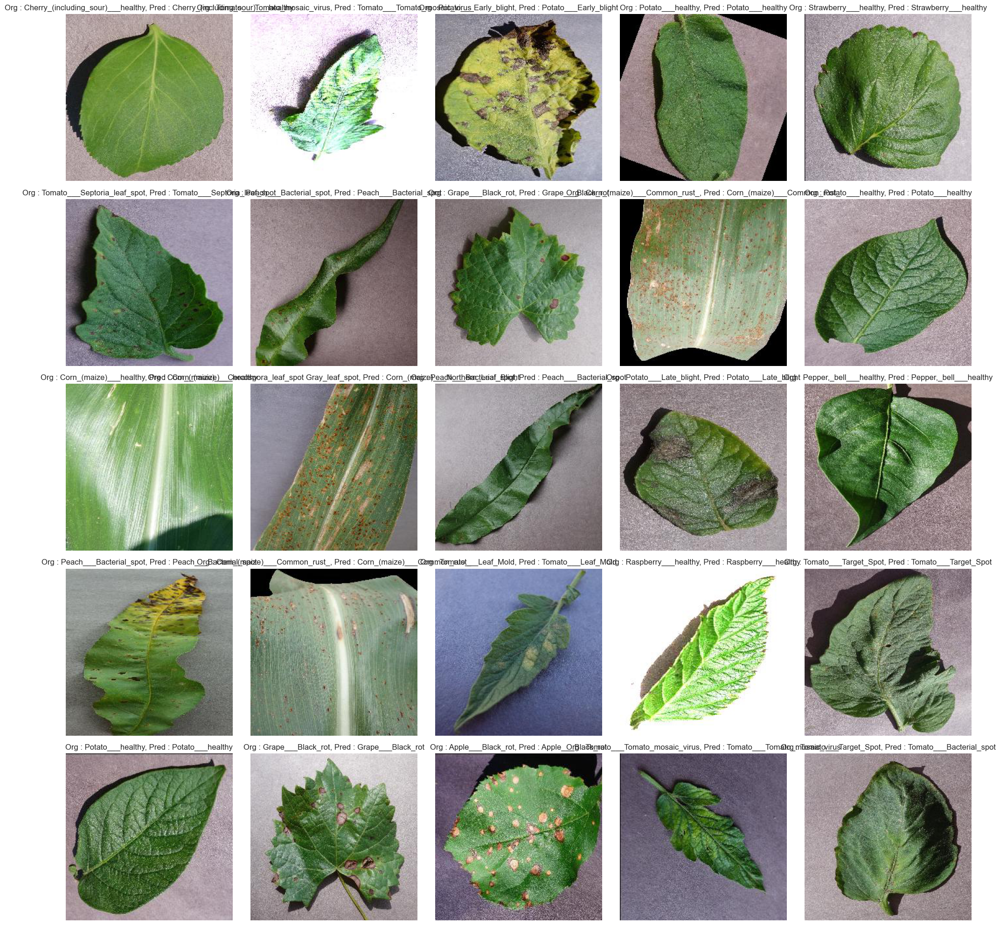

In [19]:
# Visualize Predictions
show_images(model=model, data=valid_ds)